In [1]:
# conda base 

# Data manipulation 
import pandas as pd 
import numpy as np
import os

# Data viz
import matplotlib.pyplot as plt 
import seaborn as sns
from distinctipy import distinctipy
import plotly.express as px
import joypy

This notebook shows the patters in seq space when we mapp differentes propertiers

# load data and plot functions

In [2]:
! ls ../results/dim_redo/splitted_classes/tsne/

all_plm_mbl.csv			     tsne_2d_perptest_mbl_350_esm1b.csv
all_plm_sbl.csv			     tsne_2d_perptest_mbl_400_esm1b.csv
tsne_2d_clust90_mbl_esm1b.csv	     tsne_2d_perptest_mbl_56_esm1b.csv
tsne_2d_clust90_sbl_esm1b.csv	     tsne_2d_perptest_mbl_5_esm1b.csv
tsne_2d_fulldset_mbl_esm1b.csv	     tsne_2d_perptest_sbl_100_esm1b.csv
tsne_2d_fulldset_sbl_esm1b.csv	     tsne_2d_perptest_sbl_151_esm1b.csv
tsne_2d_itertest_mbl_1000_esm1b.csv  tsne_2d_perptest_sbl_200_esm1b.csv
tsne_2d_itertest_mbl_1500_esm1b.csv  tsne_2d_perptest_sbl_227_esm1b.csv
tsne_2d_itertest_mbl_2000_esm1b.csv  tsne_2d_perptest_sbl_250_esm1b.csv
tsne_2d_itertest_mbl_2500_esm1b.csv  tsne_2d_perptest_sbl_300_esm1b.csv
tsne_2d_itertest_mbl_3000_esm1b.csv  tsne_2d_perptest_sbl_350_esm1b.csv
tsne_2d_itertest_mbl_3500_esm1b.csv  tsne_2d_perptest_sbl_400_esm1b.csv
tsne_2d_itertest_mbl_4000_esm1b.csv  tsne_2d_perptest_sbl_50_esm1b.csv
tsne_2d_itertest_mbl_500_esm1b.csv   tsne_2d_perptest_sbl_5_esm1b.csv
tsne_2d_itertest_sbl_1000_esm1b.

In [3]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_plm = df_plm[["seq_id", "carp640M_logp"]]
df_annot_plm = pd.merge(df_annot, df_plm, on = "seq_id")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot_plm, on = "seq_id")
df_sbl_a = df_sbl[df_sbl.bla_class == "Class A"]
df_sbl_c = df_sbl[df_sbl.bla_class == "Class C"]
df_sbl_d = df_sbl[df_sbl.bla_class == "Class D"]
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot_plm, on = "seq_id")

# load per class dsets and merge annots
# note: df_b and df_mbl are exactly the same dset 
# protein_family_header col was removed to avoid col duplication in the merged dset
df_a = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_A_esm1b.csv")
df_c = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_C_esm1b.csv")
df_d = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_D_esm1b.csv")
df_b = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_B_esm1b.csv")
del df_a["protein_family_header"]
del df_c["protein_family_header"]
del df_d["protein_family_header"]
del df_b["protein_family_header"]
df_a = df_a.merge(df_annot_plm, on = "seq_id")
df_c = df_c.merge(df_annot_plm, on = "seq_id")
df_d = df_d.merge(df_annot_plm, on = "seq_id")
df_b = df_b.merge(df_annot_plm, on = "seq_id")

# load and merge representative dsets
df_sbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_sbl_esm1b.csv")
df_mbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_mbl_esm1b.csv")
df_sbl90 = df_sbl90.merge(df_annot, on = "seq_id")
df_mbl90 = df_mbl90.merge(df_annot, on = "seq_id")

In [4]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = ["protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()
    
df_sbl.columns

Index(['tSNE1_esm1b', 'tSNE2_esm1b', 'seq_id', '#name', 'seq', 'length',
       'filename', 'protein_name', 'protein_family', 'bla_class',
       'bla_subclass', 'protein_family_header', 'molecular_weight',
       'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy',
       'helix', 'turn', 'sheet', 'is_clust90_rep', 'bitscore', 'Domain',
       'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species',
       'predicted_signal_peptide', 'Other_sigpept', 'SP(Sec/SPI)',
       'LIPO(Sec/SPII)', 'TAT(Tat/SPI)', 'TATLIPO(Sec/SPII)',
       'PILIN(Sec/SPIII)', 'CS Position', 'seq_without_sigpept',
       'carp640M_logp'],
      dtype='object')

# biochem properties

##  distro

In [24]:
properties = ['length','molecular_weight', 'aromaticity', 'instability', 'gravy', 
         'isoelectric_point','entropy','helix', 'turn', 'sheet']

def do_hist_panel(df, title):
    
    """
    Plot a data panel of 10 biochem props given a df and a title
    """
    
    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties):
   
        
        # plot
        ax = plt.subplot(3, 4, idx+1)
        sns.histplot(
            data = df, x = prop, y = "bla_subclass", ax = ax)
        plt.title(prop)
        

        
    plt.suptitle(title)
    plt.tight_layout()
    
def do_hist_panel2(df, title):
    
    """
    Plot a data panel of 10 biochem props given a df and a title
    """
    
    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties):
   
        
        # plot
        ax = plt.subplot(3, 4, idx+1)
        sns.histplot(
            data = df, x = prop, hue = "bla_subclass", kde=True, ax = ax)
        plt.title(prop)
        

        
    plt.suptitle(title)
    plt.tight_layout()


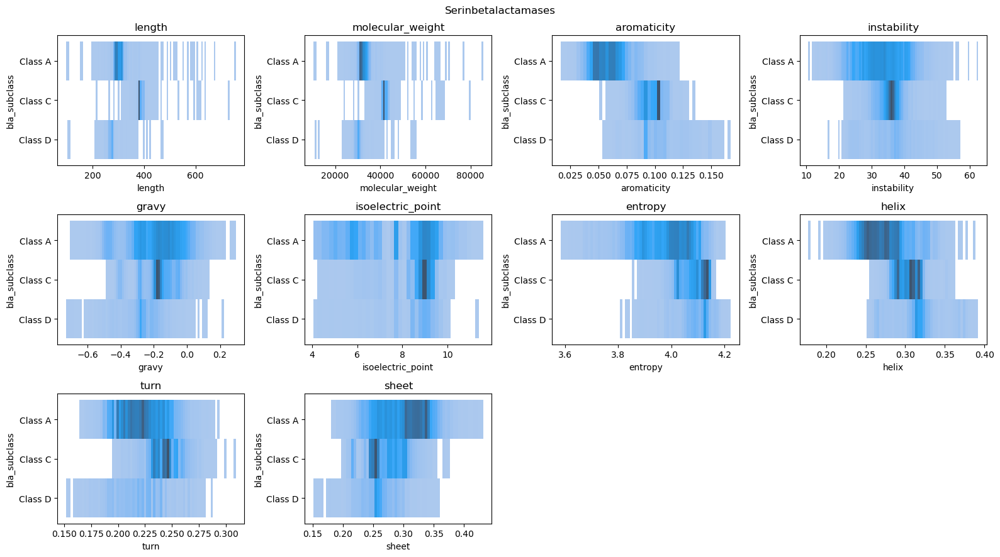

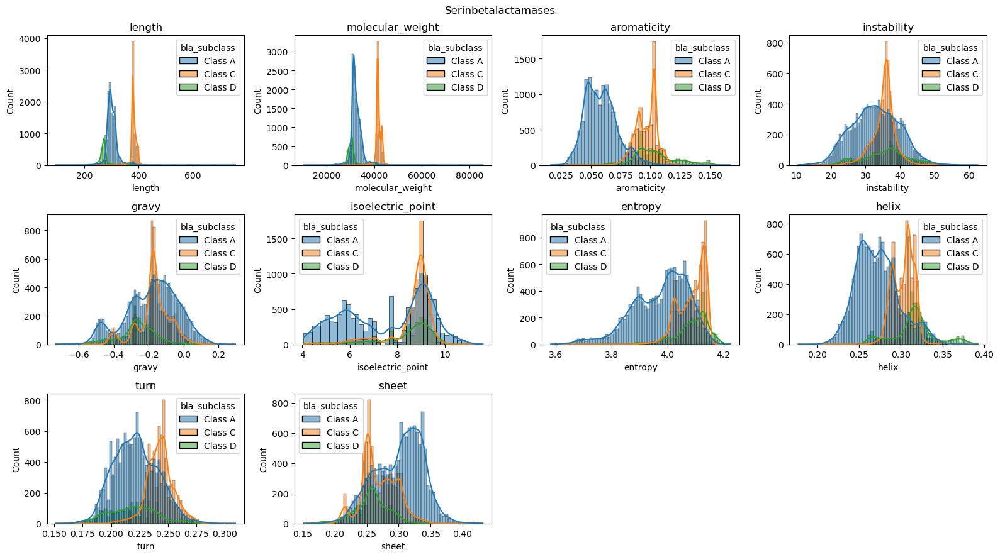

In [25]:
do_hist_panel(df_sbl[df_sbl.bla_subclass.str.contains("Class A|Class C|Class D")], "Serinbetalactamases")
do_hist_panel2(df_sbl[df_sbl.bla_subclass.str.contains("Class A|Class C|Class D")], "Serinbetalactamases")


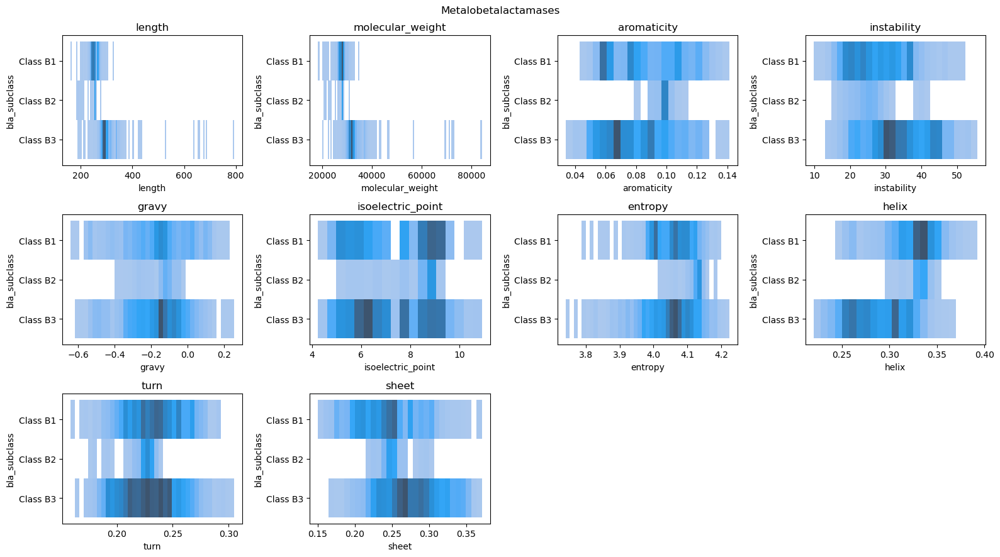

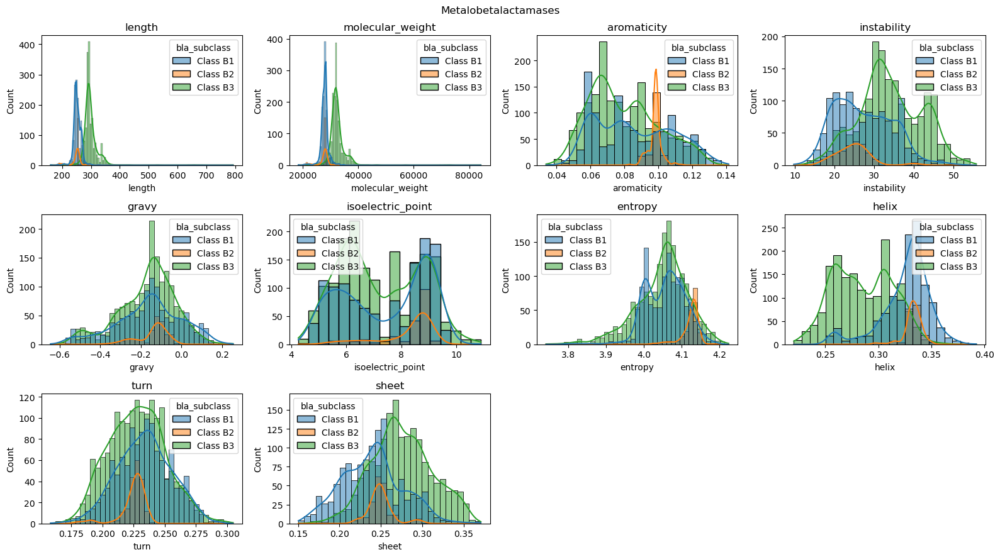

In [28]:
do_hist_panel(df_mbl[df_mbl.bla_subclass.str.contains("Class B1|Class B2|Class B3")], "Metalobetalactamases")
do_hist_panel2(df_mbl[df_mbl.bla_subclass.str.contains("Class B1|Class B2|Class B3")], "Metalobetalactamases")

## scatter 

In [7]:
# list biochem props
properties = ['length','molecular_weight', 'aromaticity', 'instability', 'gravy', 
         'isoelectric_point','entropy','helix', 'turn', 'sheet'] 

# plot fx
# https://towardsdatascience.com/4-simple-tips-for-plotting-multiple-graphs-in-python-38df2112965c
# https://stackoverflow.com/questions/62163460/remove-one-out-of-two-legends-from-seaborn-scatterplot 
# https://stackoverflow.com/questions/49761221/make-seaborn-show-a-colorbar-instead-of-a-legend-when-using-hue-in-a-bar-plot

def do_scatter_panel(df, title):
    
    """
    Plot a data panel of 10 biochem props given a df and a title
    """
    
    # set figure composition
    plt.figure(figsize=(16,9)) # 25,10
    
    # iterate over each panel
    for idx, prop in enumerate(properties):
   
        # create continuous colorbar normalized
        norm = plt.Normalize(df[prop].min(), df[prop].max())
        sm = plt.cm.ScalarMappable(cmap = "Spectral_r", norm = norm)
        sm.set_array([])
        
        # plot
        ax = plt.subplot(3, 4, idx+1)
        sns.scatterplot(
            data = df.sort_values(prop, ascending=False), x = "tSNE1_esm1b", y = "tSNE2_esm1b", alpha = 0.4, s = 20,
            style = "bla_subclass", hue = prop, palette = "Spectral_r", edgecolor = "grey", ax = ax)
        plt.title(prop)
        
        # to remove the second legend set for bla_subclass
        # handles, labels = ax.get_legend_handles_labels()
        # plt.legend(handles[1:6],labels[1:6], frameon = False, loc='upper left', bbox_to_anchor=(1.01, 1))
        
        # remove dafault legend and add colorbar
        ax.get_legend().remove()
        ax.figure.colorbar(sm)
        
    plt.suptitle(title)
    plt.tight_layout()

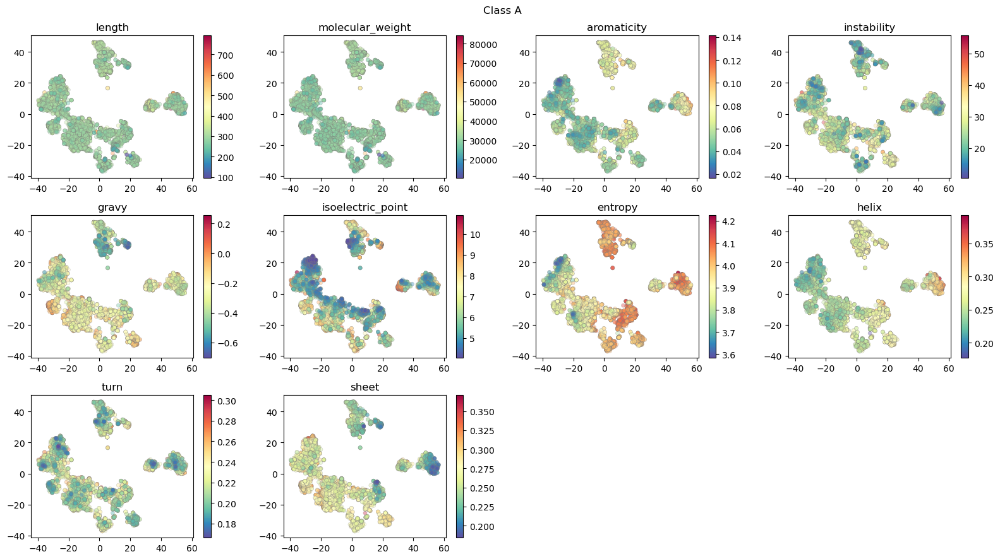

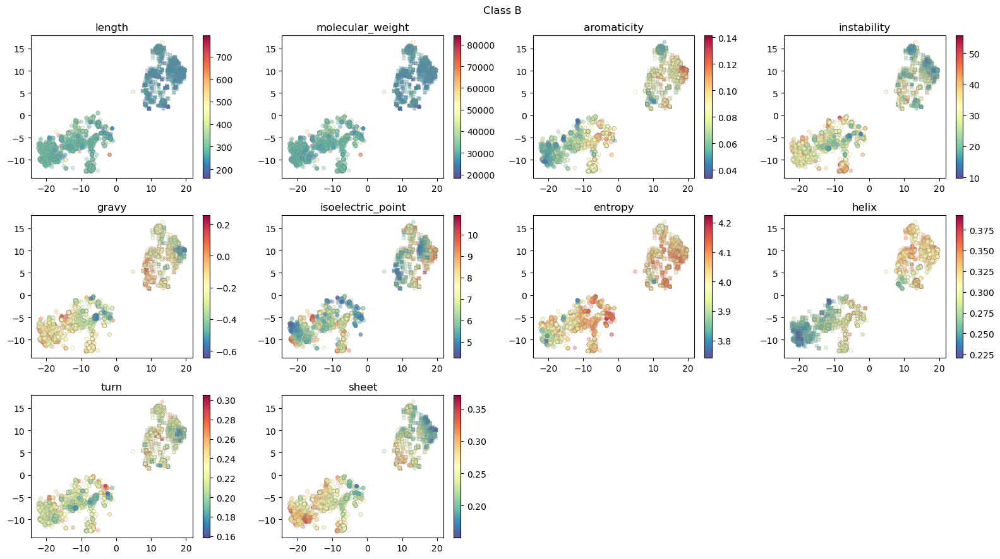

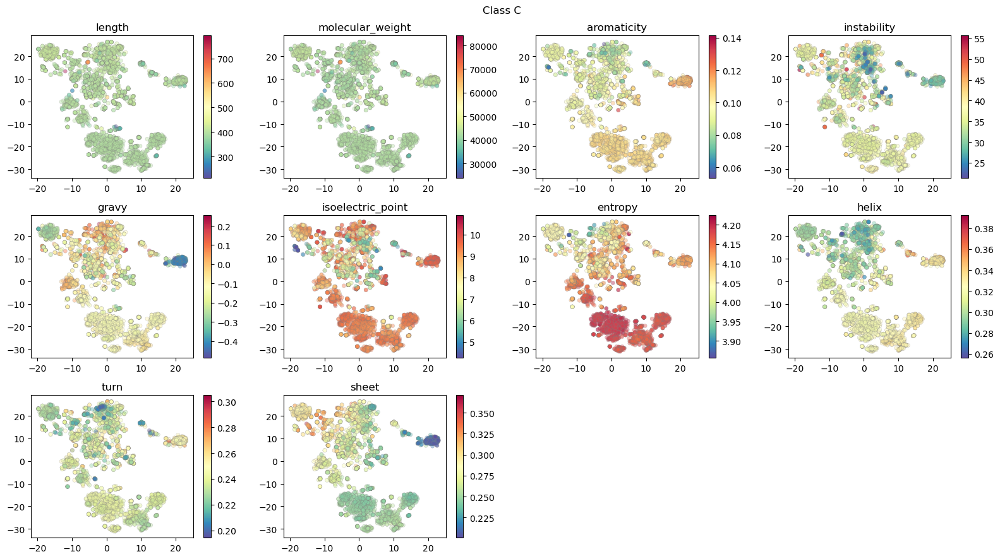

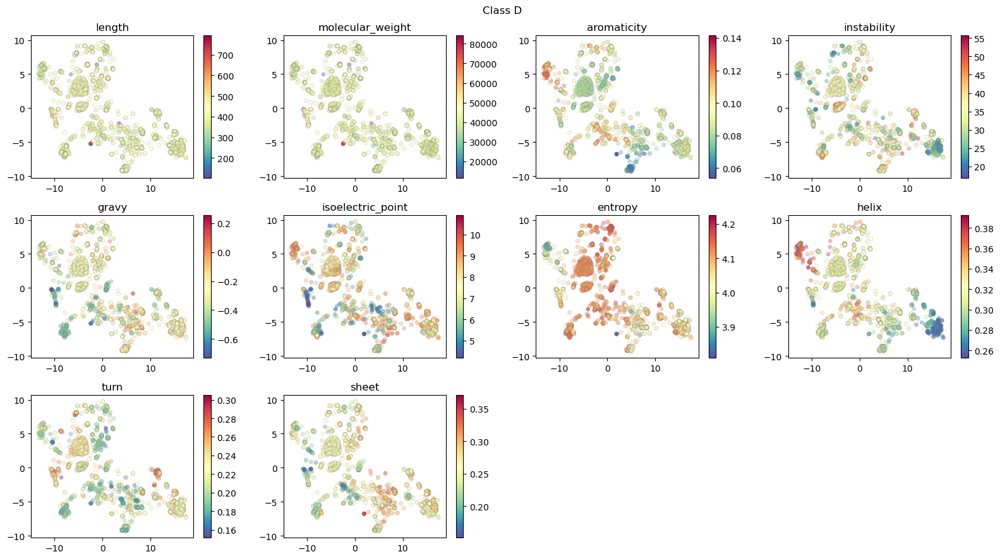

In [6]:
do_scatter_panel(df_a, "Class A")
do_scatter_panel(df_b, "Class B")
do_scatter_panel(df_c, "Class C")
do_scatter_panel(df_d, "Class D")

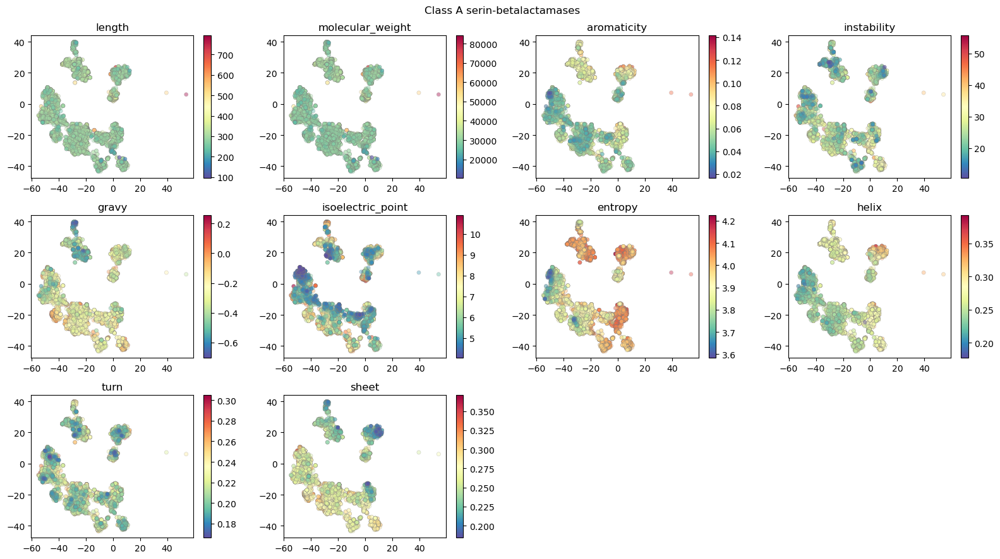

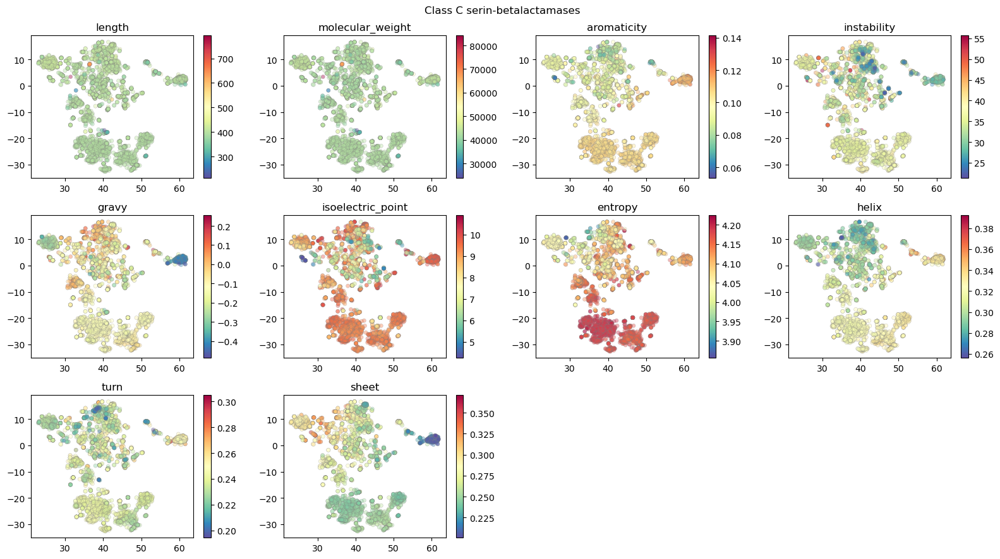

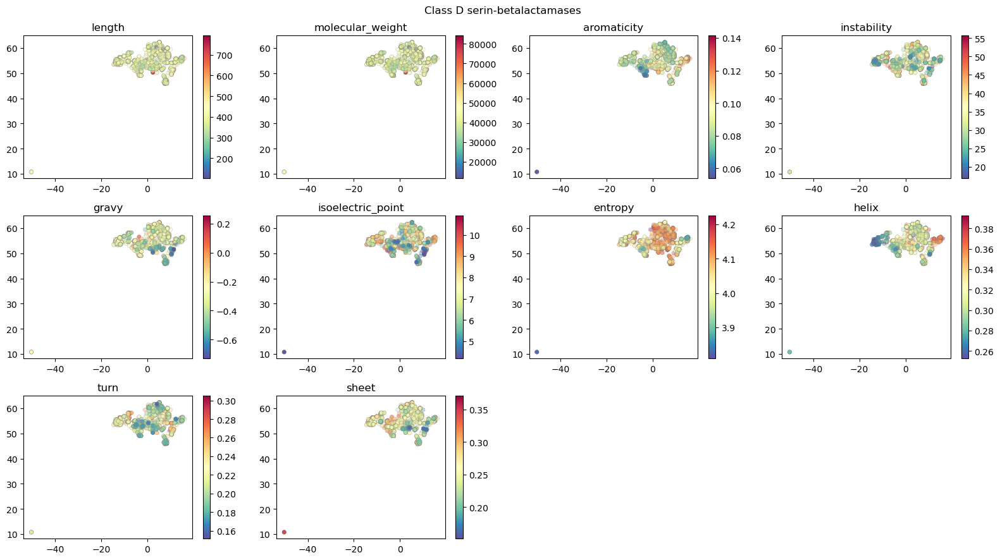

In [7]:
do_scatter_panel(df_sbl_a, "Class A serin-betalactamases")
do_scatter_panel(df_sbl_c, "Class C serin-betalactamases")
do_scatter_panel(df_sbl_d, "Class D serin-betalactamases")

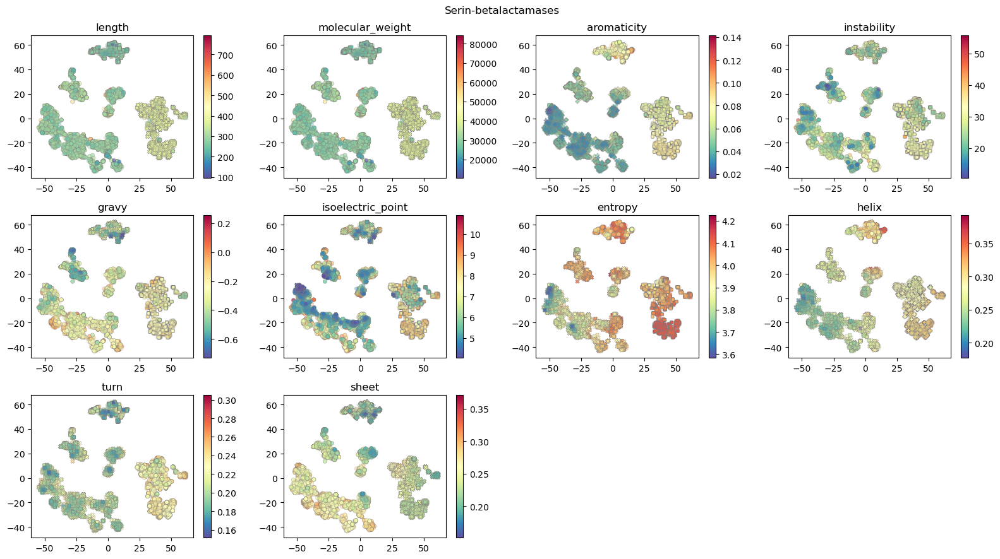

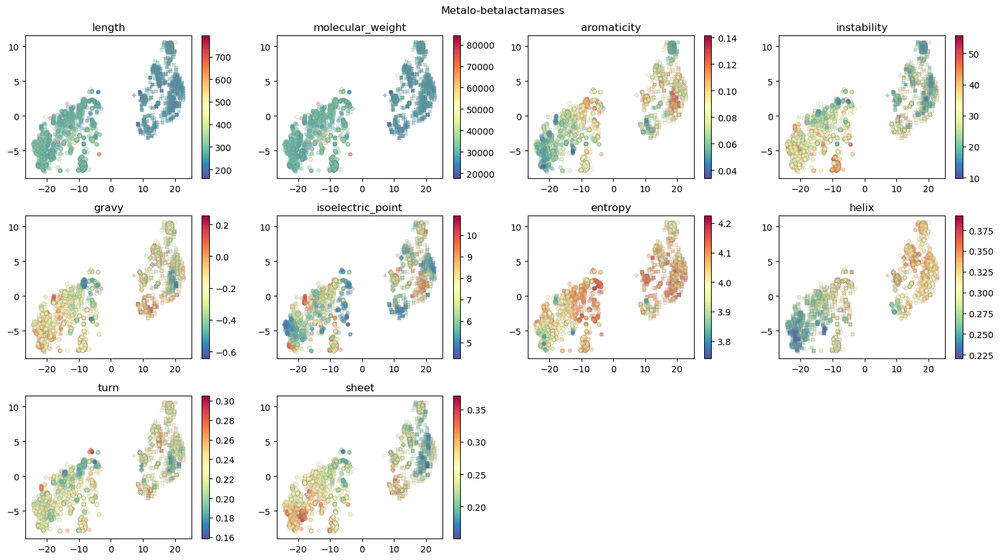

In [8]:
do_scatter_panel(df_sbl, "Serin-betalactamases")
do_scatter_panel(df_mbl, "Metalo-betalactamases")

## violin

In [9]:
def do_violin_panel(df, title):
    
    """
    Plot a data panel of 10 biochem props given a df and a title
    """
    plt.figure(figsize=(10,9)) # 25,10
    for idx, prop in enumerate(properties):
        ax = plt.subplot(4,3, idx+1)
        sns.violinplot(data = df, x = "bla_subclass", y=prop, 
                       palette = "pastel", ax = ax)
        plt.xlabel("")
        plt.ylabel("Value")
        plt.title(prop)
    plt.suptitle(title)
    plt.tight_layout()

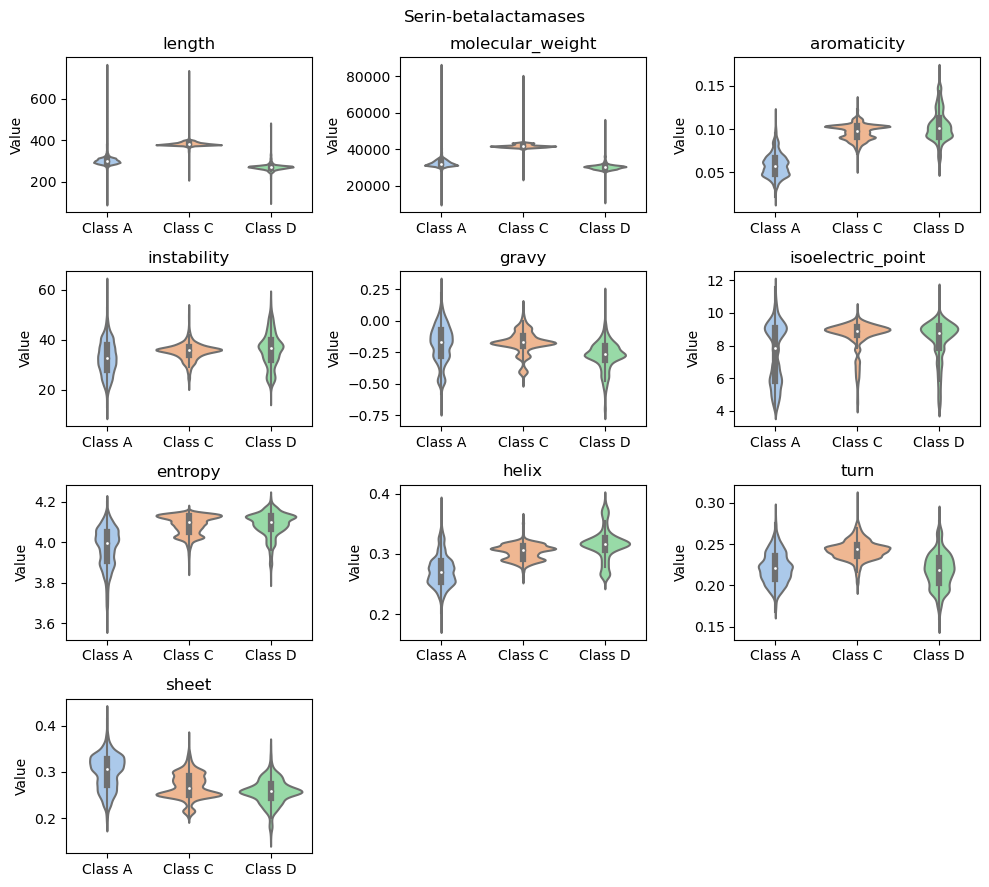

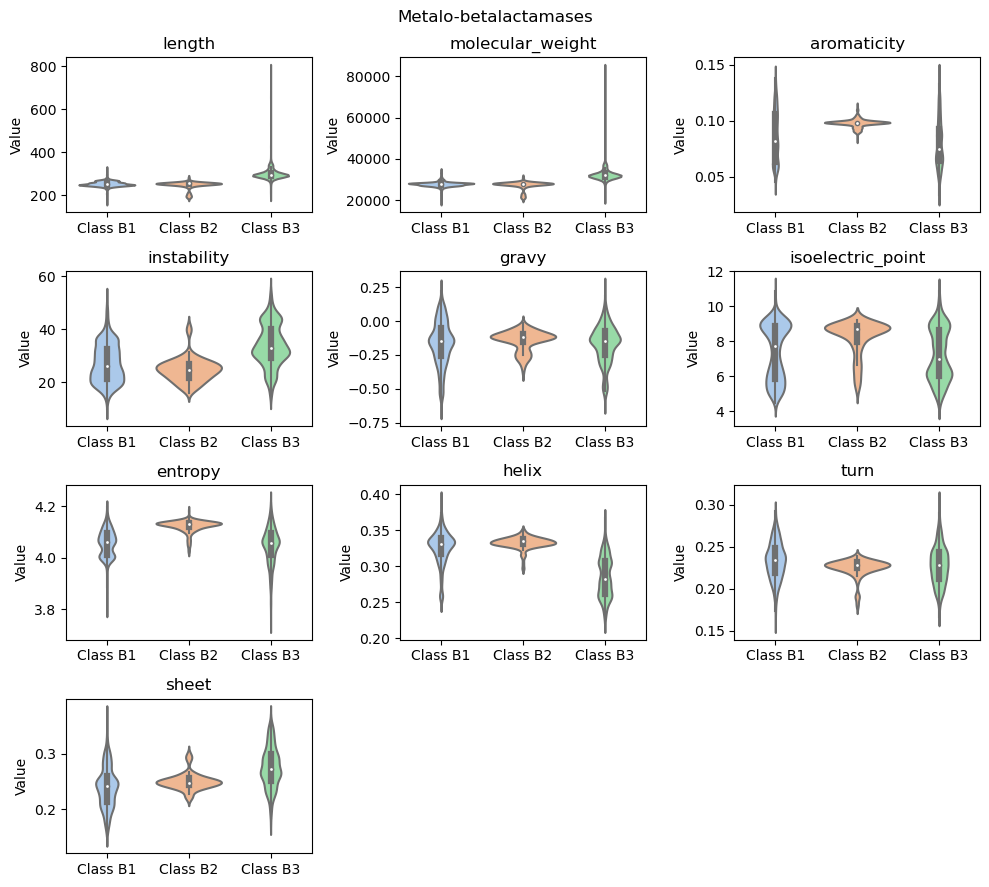

In [10]:
do_violin_panel(df_sbl[~df_sbl.bla_class.str.contains("Cons|Risso|Anc")], "Serin-betalactamases")
do_violin_panel(df_mbl[~df_mbl.bla_class.str.contains("Cons")], "Metalo-betalactamases")

## joyplot 

In [11]:
df_annot.groupby(['bla_subclass'])['length'].describe()

,count,mean,std,min,25%,50%,75%,max
bla_subclass,,,,,,,,
Ancestral,4.0,264.000000,3.366502,262.0,262.0,262.5,264.5,269.0
Class A,13315.0,302.437927,25.210312,95.0,291.0,299.0,311.0,757.0
Class B1,1207.0,252.527755,12.653267,160.0,246.0,250.0,258.5,326.0
Class B2,201.0,247.169154,17.992811,186.0,253.0,254.0,254.0,279.0
Class B3,1722.0,299.721835,33.281796,189.0,288.0,293.0,305.0,793.0
Class C,6586.0,382.835712,14.831118,212.0,377.0,381.0,388.0,730.0
Class D,2779.0,271.611011,18.376086,102.0,265.0,272.0,274.0,475.0
Consensus,7.0,245.857143,57.808386,162.0,229.5,242.0,250.5,357.0
Risso cons,1.0,262.000000,NaN,262.0,262.0,262.0,262.0,262.0


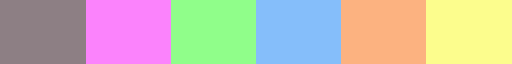

In [12]:
# Define the color pallete for the 21 antibiotics 
my_colors = distinctipy.get_colors(6, pastel_factor=1) # antibiotic categos  
distinctipy.get_colormap(my_colors)

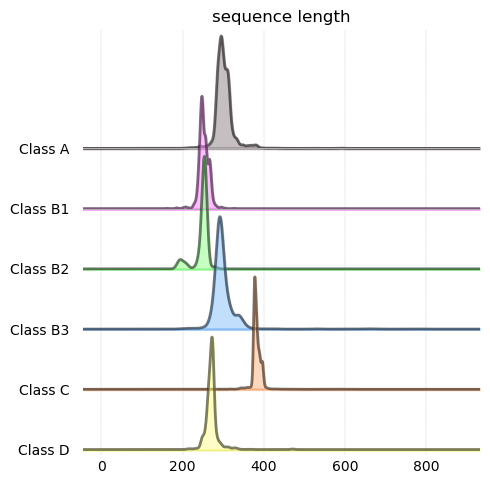

In [13]:
df_blaclass = df_annot[df_annot.bla_class.str.contains("Class A|Class B|Class C|Class D")]

# seq_length by bla_class
fig, axes = joypy.joyplot(df_blaclass[["length", "bla_subclass"]], by="bla_subclass", ylim='own', 
                overlap=1, range_style='all', grid=True, linewidth=2, legend=False, figsize=(5,5), 
                alpha=0.5, linecolor="black", background='white',fill=True,
                 kind="kde", title = "sequence length",
                colormap=distinctipy.get_colormap(my_colors)) 
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.15)

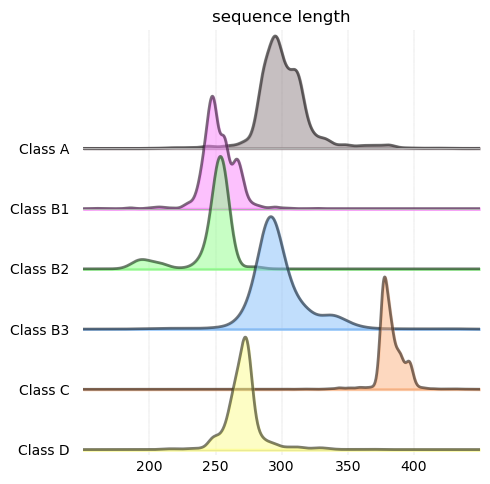

In [14]:
# seq_length by bla_class
fig, axes = joypy.joyplot(df_blaclass[["length", "bla_subclass"]], by="bla_subclass", ylim='own', 
                overlap=1, range_style='all', grid=True, linewidth=2, legend=False, figsize=(5,5), 
                alpha=0.5, linecolor="black", background='white',fill=True,
                 kind="kde",x_range=[150, 450], title = "sequence length",
                colormap=distinctipy.get_colormap(my_colors)) 
plt.grid(color = 'grey', linestyle = '--', linewidth = 0.15)

## corr matrix

In [15]:
def do_corr_mat(method, df, title):
    
    """
    Compute a corr matrix given a method (pearson/spearman), df and title
    """
    
    # compute corr, mask and palette
    corr_r = df.corr(method = method)
    mask_r = np.triu(np.ones_like(corr_r, dtype=bool)) 
    custom_cmap = sns.diverging_palette(15, 250, as_cmap=True) # custom diverging cmap
    
    # plot
    plt.figure(figsize=(8,8))
    sns.heatmap(
        corr_r, mask = mask_r, cmap = custom_cmap, vmax = 1, vmin = -1, annot=True, fmt = ".2f",
        square=True, linewidths=0, center = 0,
        annot_kws = {"fontsize": 10, "alpha": 0.2},
        cbar_kws = {"shrink": 0.5, "location": "bottom", "pad": -1})
    plt.title(f"{title} ({method} correlation)")
    plt.ylabel("")
    plt.xlabel("")
    plt.xticks(rotation = 50)

In [16]:
# take the tsne coords and biochem values
selected_cols = ["tSNE1_esm1b","tSNE2_esm1b","length",'molecular_weight','aromaticity', 'instability', 'gravy', 
                 'isoelectric_point', 'entropy','helix', 'turn', "sheet"]

# create dfs
# from joint classes 
df_biochem_mbl = df_mbl[selected_cols] 
df_biochem_sbl = df_sbl[selected_cols] 
df_biochem_sbl_a = df_sbl_a[selected_cols] 
df_biochem_sbl_c = df_sbl_c[selected_cols] 
df_biochem_sbl_d = df_sbl_d[selected_cols] 

# from single sets
df_biochem_a = df_a[selected_cols] 
df_biochem_b = df_b[selected_cols]
df_biochem_c = df_c[selected_cols]
df_biochem_d = df_d[selected_cols]

### sbl

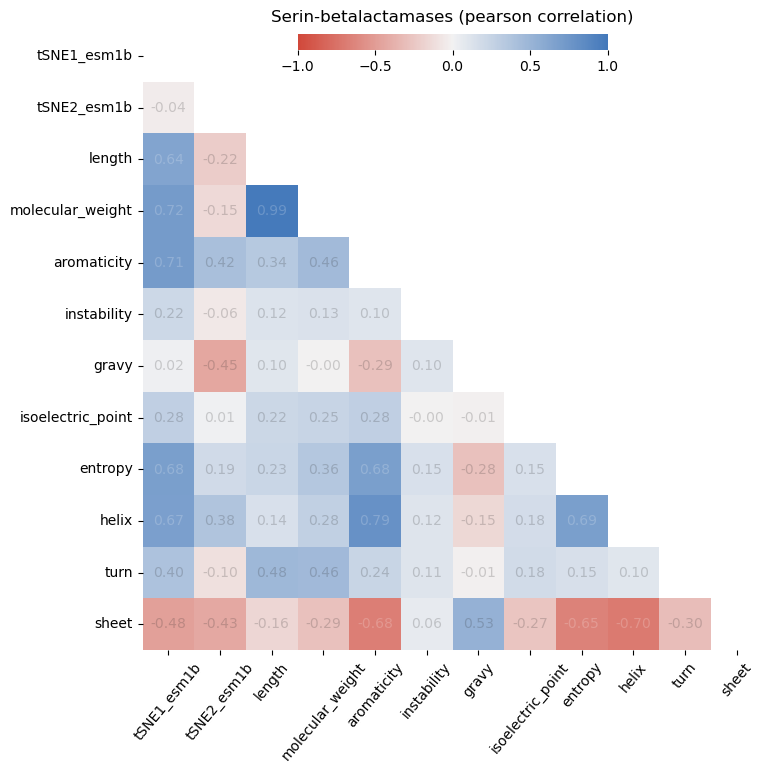

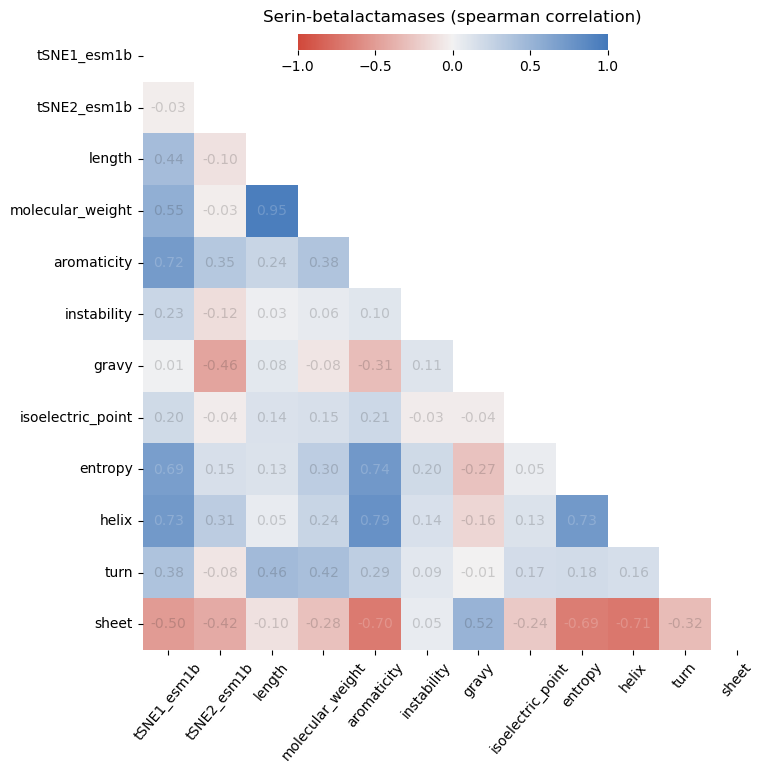

In [17]:
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_sbl, "Serin-betalactamases")

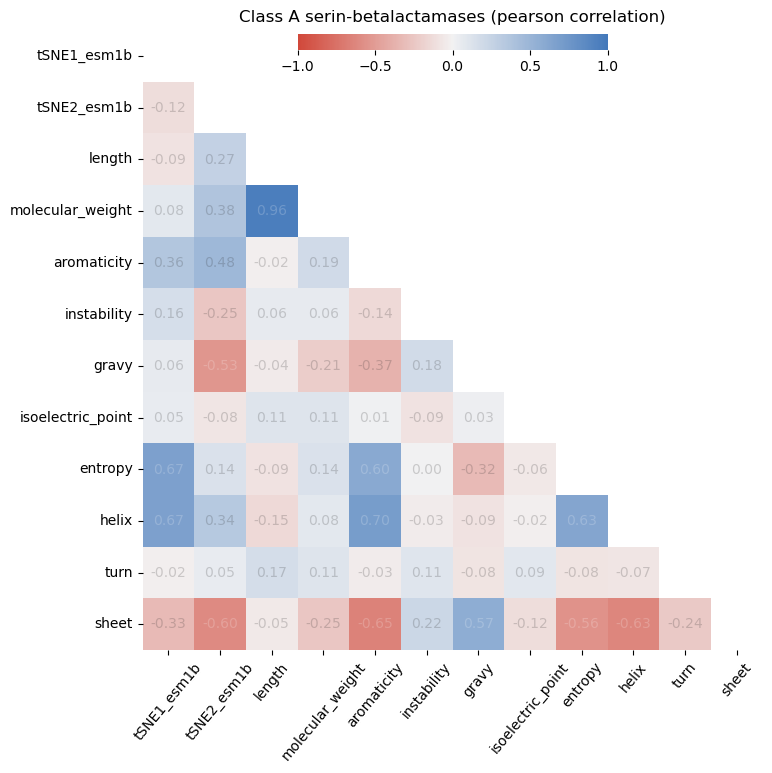

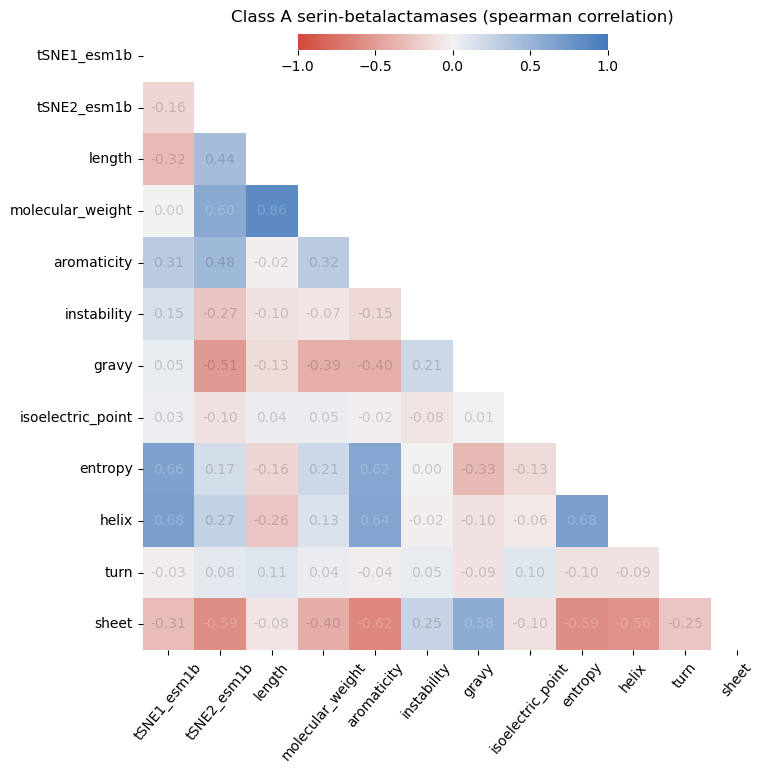

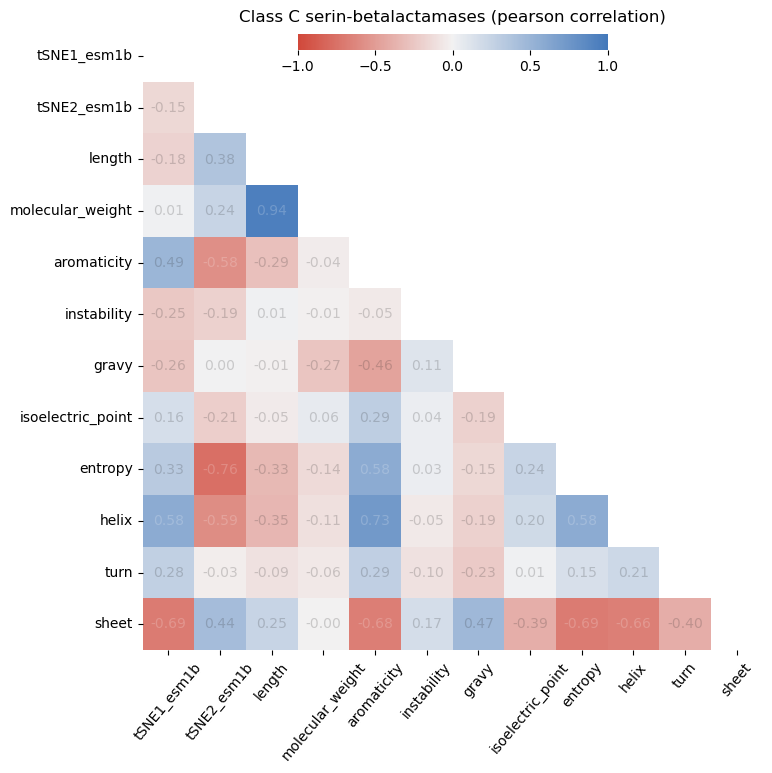

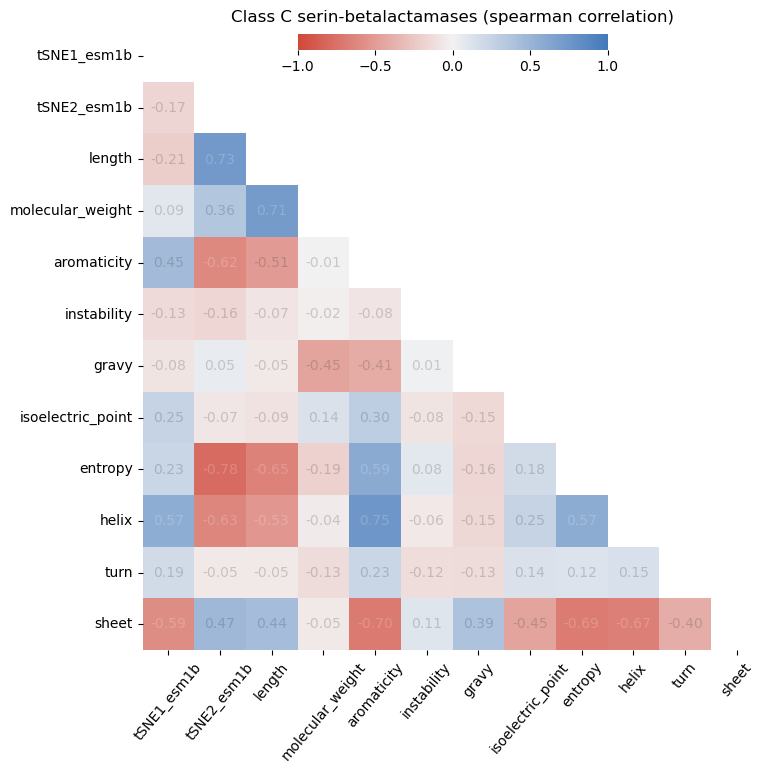

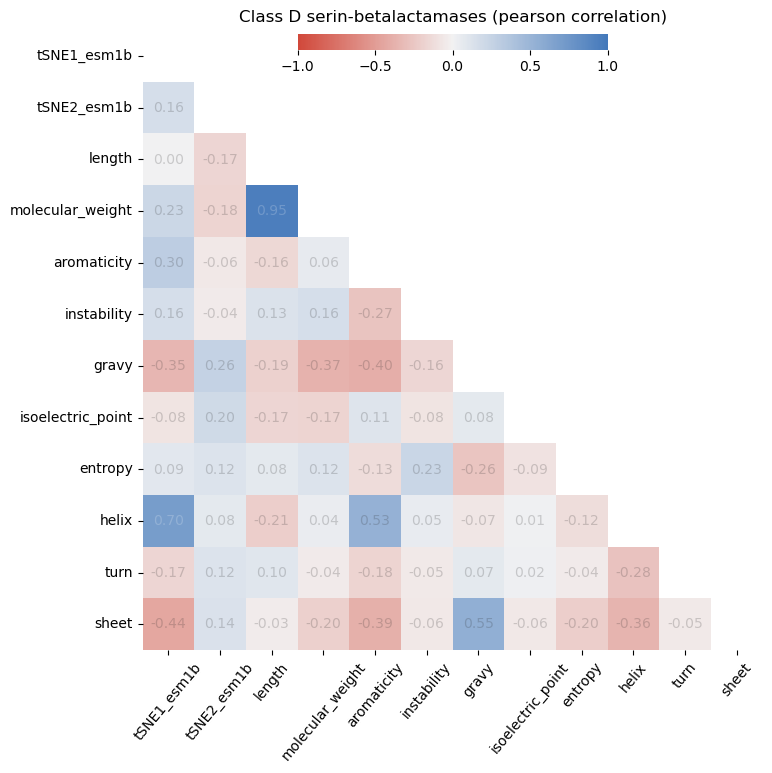

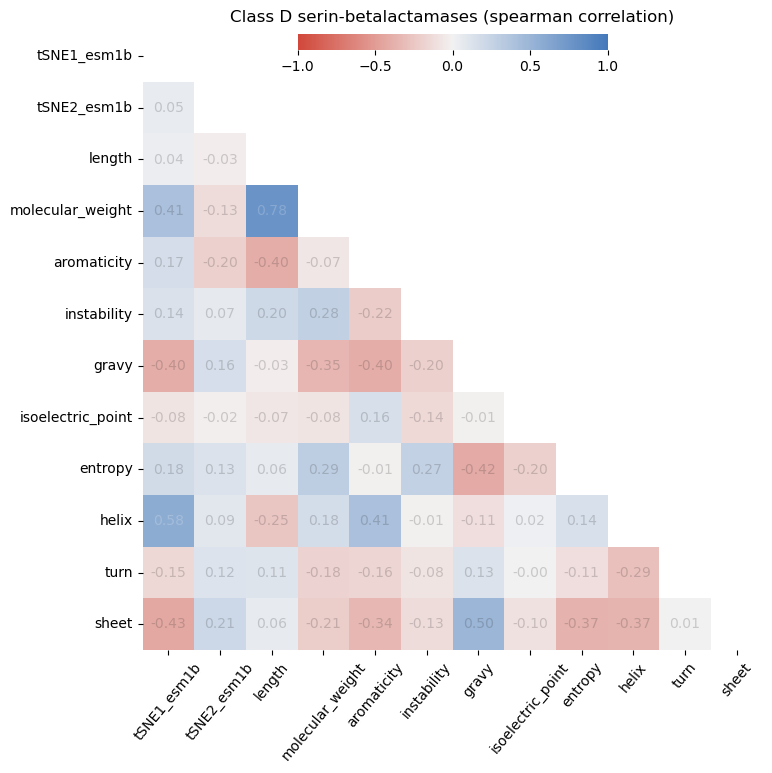

In [18]:
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_sbl_a, "Class A serin-betalactamases")
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_sbl_c, "Class C serin-betalactamases")
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_sbl_d, "Class D serin-betalactamases")

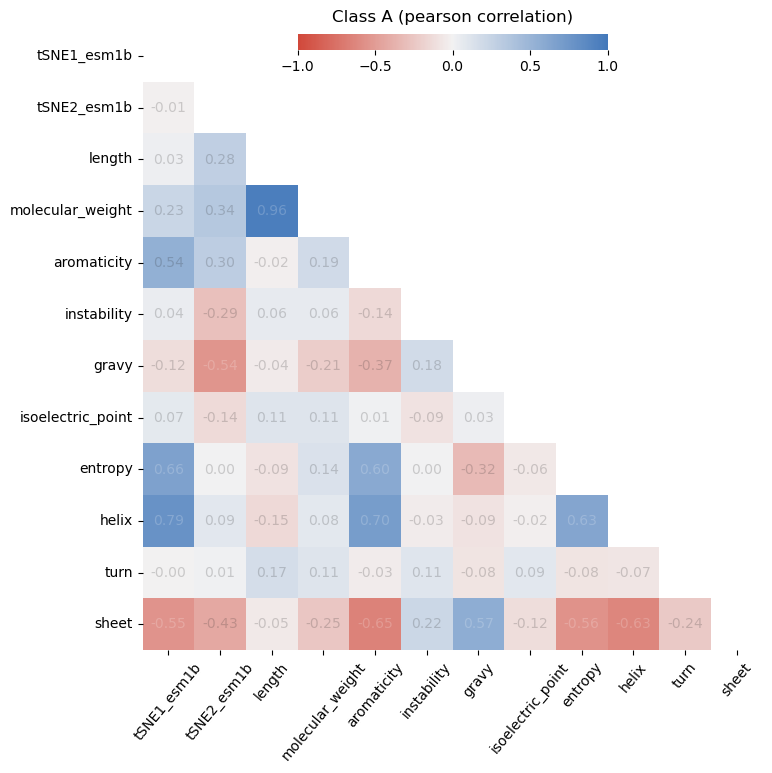

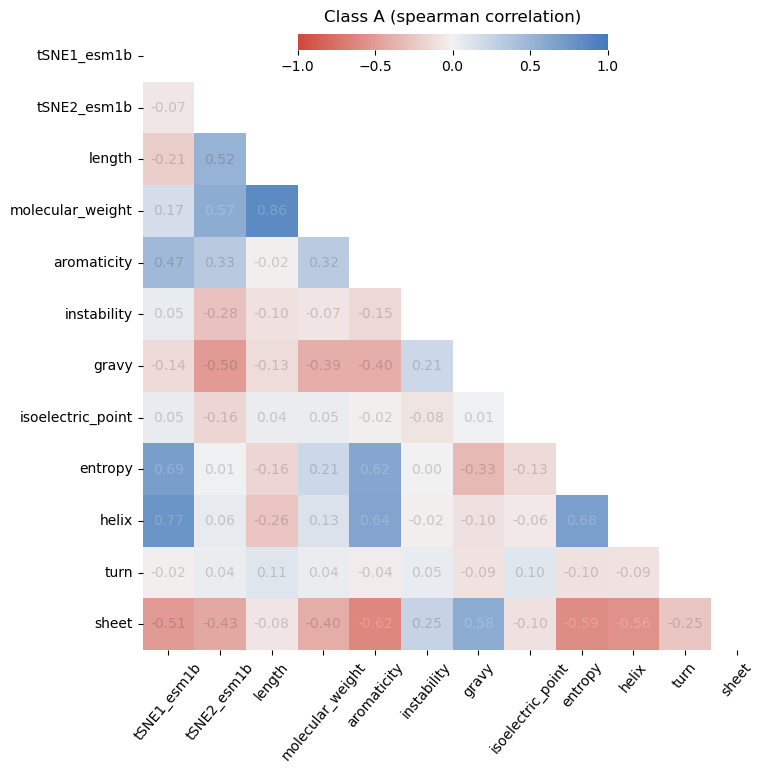

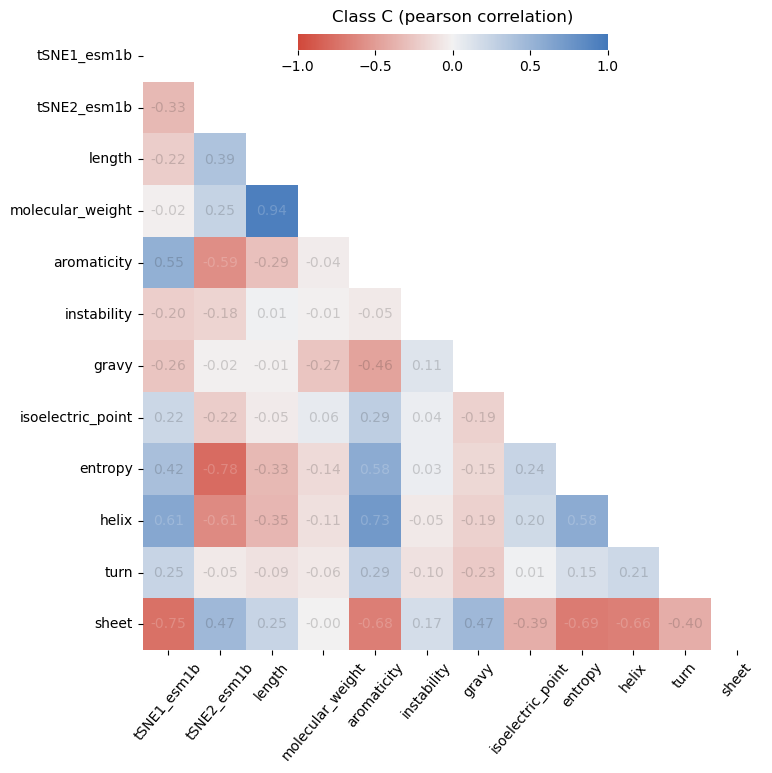

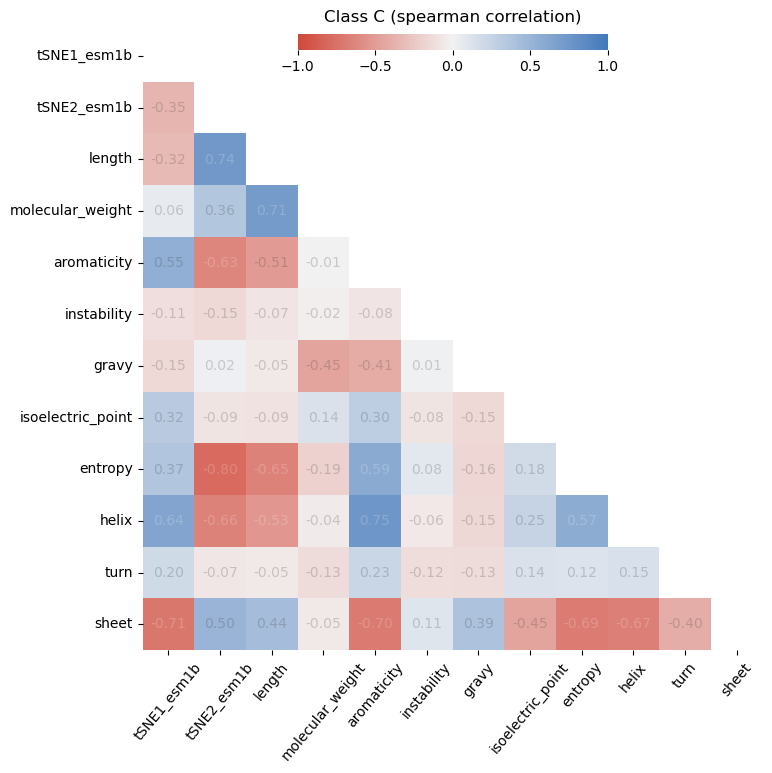

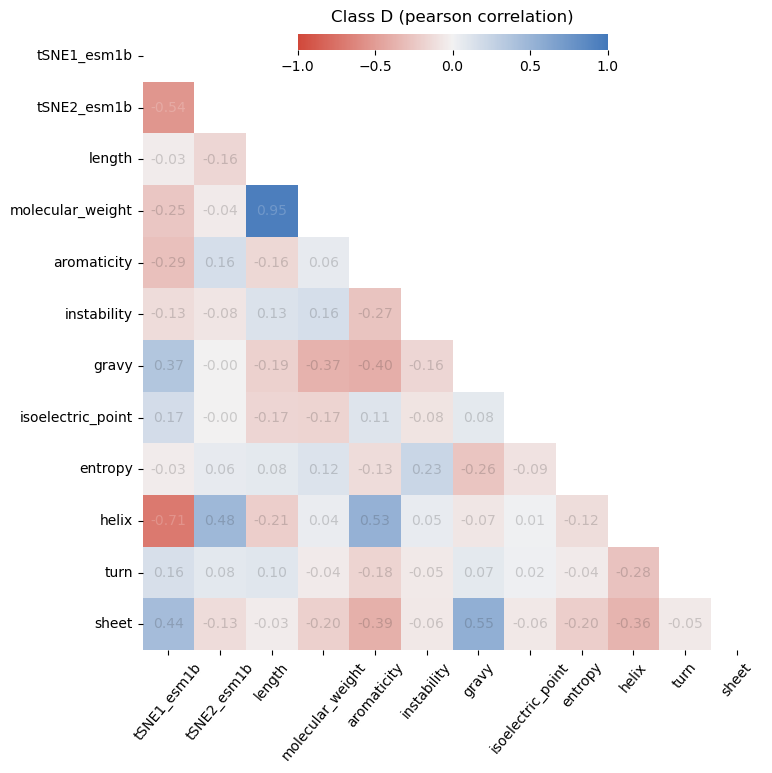

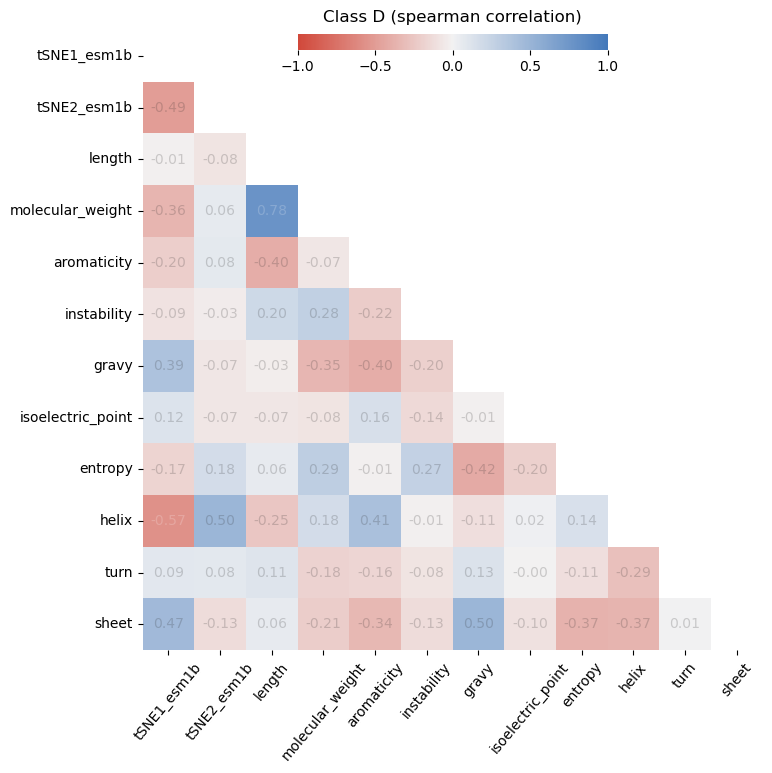

In [19]:
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_a, "Class A")
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_c, "Class C")
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_d, "Class D")

### mbl

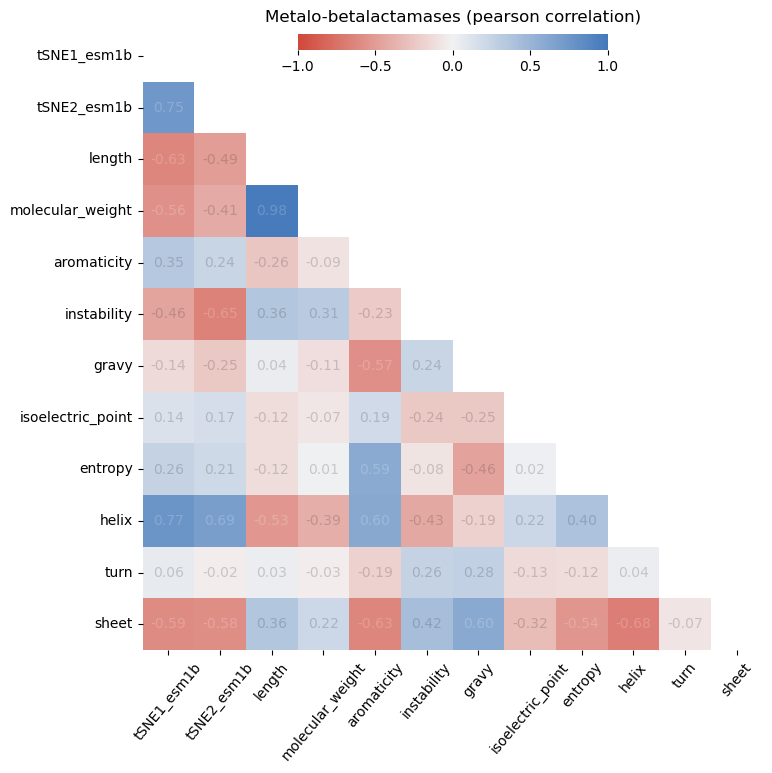

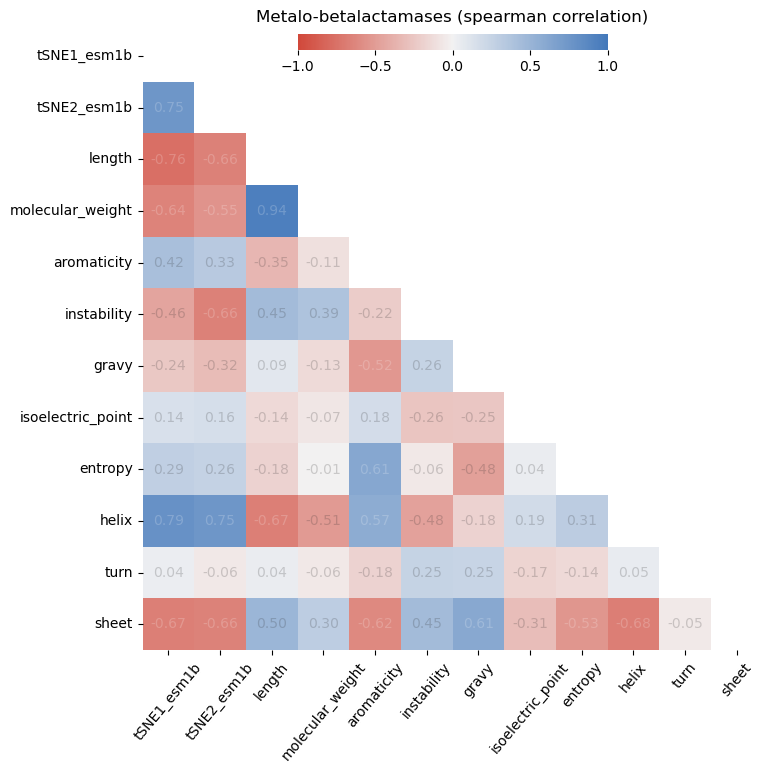

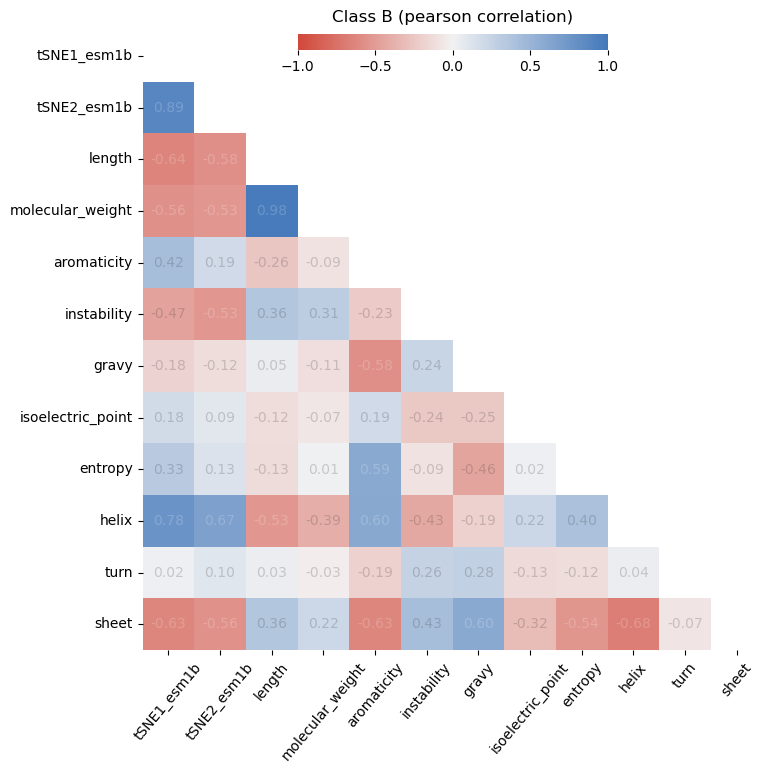

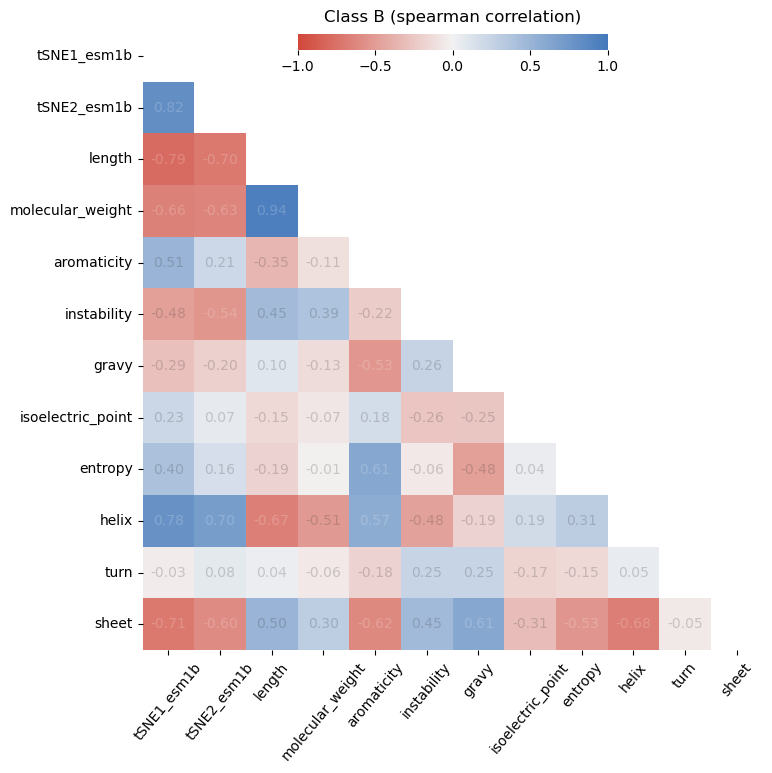

In [20]:
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_mbl, "Metalo-betalactamases")
for method in ["pearson", "spearman"]:
    do_corr_mat(method, df_biochem_b, "Class B")

# bifunctional

The set of IDs comes from: [Genomic analysis of bifunctional Class C-Class D β-lactamases in environmental bacteria](https://pubmed.ncbi.nlm.nih.gov/29846396/)
1. WP_082565248.1|CD2-1| class C beta-lactamase
1. WP_082507116.1|CD4-2| class C beta-lactamase
1. WP_082591432.1|CD4-1| class C beta-lactamase	
1. SFG43659.1|CD3-1| Beta-lactamase class D [Duganella sp. CF458]
1. OEZ55387.1|CD1-1| beta-lactamase [Duganella sp. HH105]	
1. SHH20105.1|CD5-1| Beta-lactamase class D [Massilia sp. CF038]	
1. WP_082552146.1|CD6-1| class C beta-lactamase		
1. KQW93884.1|CD7-1| hypothetical protein ASC94_15090 [Massilia sp. Root418
1. ACH58991.1|LRA13-1| bifunctional class C beta-lactamase-class D beta-lactamase fusion protein LRA-13

In [7]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = ["protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=24, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [5]:
ids = ["WP_082565248.1", "WP_082507116.1", "WP_082591432.1", "SFG43659.1",
       "OEZ55387.1", "SHH20105.1", "WP_082552146.1", "KQW93884.1", "ACH58991.1"]

filters = [
    df_sbl["#name"].str.contains('|'.join(ids)),
    ~df_sbl["#name"].str.contains('|'.join(ids))
]

values = ["Yes", "No"]

df_sbl["Match"] = np.select(filters, values)

In [8]:
do_iscatter(df_sbl[df_sbl.bla_class.str.contains("Class C")], "Match")

In [23]:
def do_iscatter_dot(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df_sbl, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = [
        "#name", "protein_family_header", "length", 'protein_family',"protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=28, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()
    
do_iscatter_dot(df_sbl[df_sbl.bla_class.str.contains("Class C")], "is_bifunctional")

fin